<a href="https://colab.research.google.com/github/TAMIDSpiyalong/CV-for-Livestock/blob/main/Lecture_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Animal ID Using Computer Vision

The purpose of this clustering is to ID different animals to support feed measurement. We collected images from the cameras above the feed bunks and cropped the small regions of interets as our dataset. This is not the only way. We can also use the fully animal body using MaskRCNN.

The following is the general steps:
1. Collect images to be clustered.
2. Modify a pre-trained ResNet model to extract the feature (2048x1) from the last layer.
3. Apply the modified ResNet on each image to form a matrix where each row is one sample and feature vector is the column values.
4. Use k-means, DBscan, and other methods to cluster and visualize.

In [1]:
import os
import numpy as np
from random import randint
import pickle
# import seaborn as sns
from PIL import Image, ImageDraw
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
# clustering and dimension reduction
from sklearn.cluster import KMeans, DBSCAN

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import cv2
import torch
from torchvision import models, transforms

In [2]:
import gdown
import os

if "cow_images_separated_FB3_20230920.zip" not in os.listdir():

  gdown.download('https://drive.google.com/uc?export=download&id=1HACVmgRaUbZFmuXNVFw2dd3tScxr_rsP')
  ! unzip -q "cow_images_separated_FB3_20230920.zip"

# Get a list of all the images

In [3]:
directory_path = 'cow_images_separated_FB3_20230920/'  # Replace with the path to your directory

In [61]:
for root, dirs, files in os.walk(directory_path):
    print(root,dirs)

cow_images_separated_FB3_20230920/has_a_cow/ []


Here, we first try our method on the "'has_a_cow', 'no_cow'" classes which is only two classes. We assign each image a label when reading the images and store the labels in all_labels. These labels will be used to calculate the accuracy for the clustering.

In [5]:
def get_all_files_in_subfolders(folder_path):
    all_files = []
    all_labels=[]
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            file_path = os.path.join(root, file)
            all_files.append(file_path)

            class_label = 'no_cow' if 'no_cow' in file_path else 'cow'
            all_labels.append(class_label)
    return all_files,all_labels

In [6]:
all_files_in_subfolders,all_labels = get_all_files_in_subfolders(directory_path)

In [7]:
len(all_files_in_subfolders)

600

In [8]:
np.array(all_labels)

array(['no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_c

In [9]:
all_files_in_subfolders[3]

'cow_images_separated_FB3_20230920/no_cow/img_2023_08_22_10_42_17.png'

In [10]:
all_labels[3]

'no_cow'

In [11]:
images=[]
# Print the list of files
for file_path in all_files_in_subfolders:
    image=cv2.imread(file_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    images.append(image)
image_data = np.array(images)

In [12]:
image_data.shape

(600, 400, 450, 3)

# Resnet as feature extractor

Resnet pre-trained on ImageNet dataset with 1000 classes hence the pridiction shape is 1000 dimensional. We do not want to use the last layer. Instead, we want to second to last layer which is all the features. Of course you can use the third to last layer and so on. The key idea is to find a way to represent the image in the higher dimension.

In [17]:
transform = transforms.Compose([
    transforms.Resize(256),
    # transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [18]:
# Load a pre-trained ResNet model (e.g., ResNet-50)
resnet = models.resnet50(pretrained=True)
resnet.eval()
feature_extractor = torch.nn.Sequential(*list(resnet.children())[:-1])

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 126MB/s]


Now we extract features for each image. The dimension of the data input for clustering algorithms should be image numberxfeature

In [ ]:
features=[]
for image in image_data:
    # file_path=(os.path.join(directory_path, file))
    # image=cv2.imread(file_path)
    image = transform(Image.fromarray(image))
    image = image.unsqueeze(0)  # Add a batch dimension (required by the model)
    feature = feature_extractor(image) # output now has the features corresponding to input x
    features.append(feature.detach().numpy()[0][:][:])
data = np.array(features)[:,:,0,0]

In [ ]:
len(features)

In [21]:
np.array(features).shape

(600, 2048, 1, 1)

In [22]:
np.array(features)[:,:,0,0].shape

(600, 2048)

In [23]:
np.array(features)[:,:,0,0].max()

6.252849

In [24]:
np.array(features)[:,:,0,0].min()

0.0

# T-SNE

We get a high dimensional vector representing all images. Now we use T-SNE to look at the images in a 2D space to get a sense of the distribution. Here the similar images will appear closer to each other. T-SNE maps the features to a 2D vector in a linear fashion and the reason for 2D is for visualization. It is always the easiest to plot in 2D.

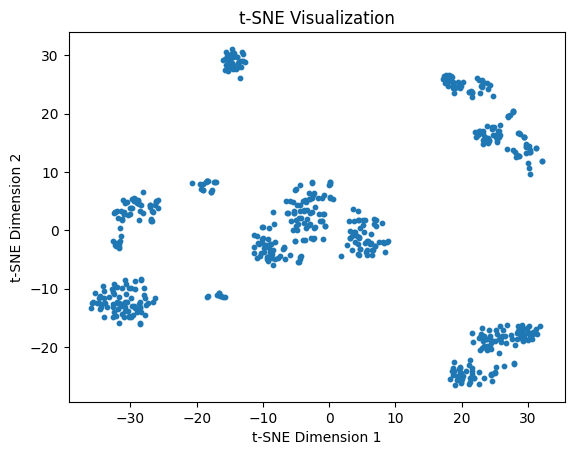

In [25]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Generate or load your data, assuming it's a (904, 2048) numpy array
# Replace this with your actual data loading or generation logic


# Initialize t-SNE with the desired number of components (2 for 2D visualization)
tsne = TSNE(n_components=2, random_state=42)

# Fit and transform your data to reduce it to 2 dimensions
tsne_result = tsne.fit_transform(data)

# Create a scatter plot to visualize the t-SNE results
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], s=10)  # s controls point size
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE Visualization')
plt.show()

Using the T-SNE mapped vectors we can do a k-means clustering and compute the adjusted_rand_score. We set the cluter number to 2 becuase we know there are only two classes: with and withou cow. The rand index is 0.99 indicating very good performance. You can print out the ground truth all_labels, and prediction cluster_labels to check. Notice here for clustering, the class numbers can be switched as long as the clustering results match the ground truth groups.

In [ ]:
# Define the number of clusters (K)
num_clusters = 3  # Adjust this to your desired number of clusters
from sklearn.metrics import adjusted_rand_score

# Perform K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(tsne_result)

ari = adjusted_rand_score(all_labels, cluster_labels)
ari

# PCA

Of course we can use PCA to reduce the feature dimensions. With or withour PCA, the kmeans methods is good to seperate the images.  

In [27]:
n_components = 5
pca = PCA(n_components=n_components)
transformed_data = pca.fit_transform(np.array(features)[:,:,0,0])

In [28]:
transformed_data.shape

(600, 5)

In [29]:
# Define the number of clusters (K)
num_clusters = 2  # Adjust this to your desired number of clusters
from sklearn.metrics import adjusted_rand_score

# Perform K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(transformed_data)

ari = adjusted_rand_score(all_labels, cluster_labels)
ari

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.9933063759598809

In [30]:
cluster_labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [31]:
np.array(all_labels)

array(['no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow',
       'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_cow', 'no_c

We randomly pick images and compare the predicted cluster and the ground truth to check. This can be applied to an entire video to get ride of the empty frames to save storage.


333
428
63
536
321
563
415
60
189
312
291
537
227
106
238
51
411
246
55
492


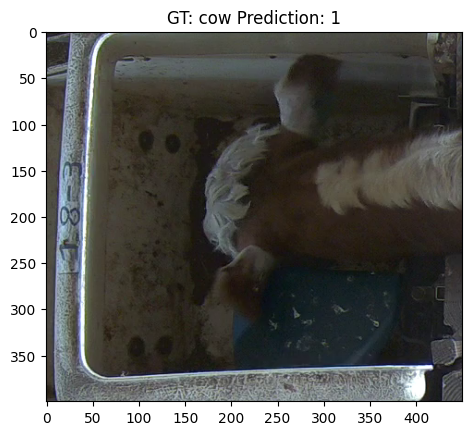

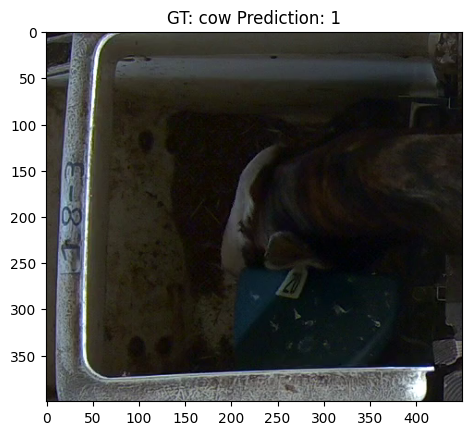

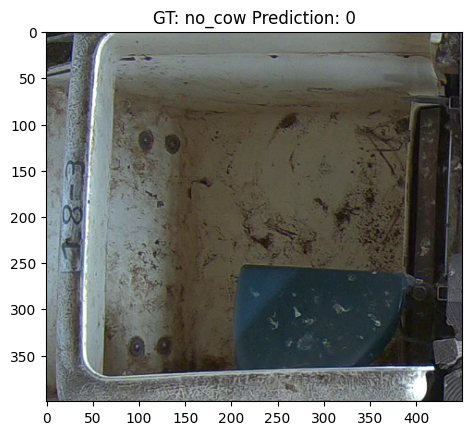

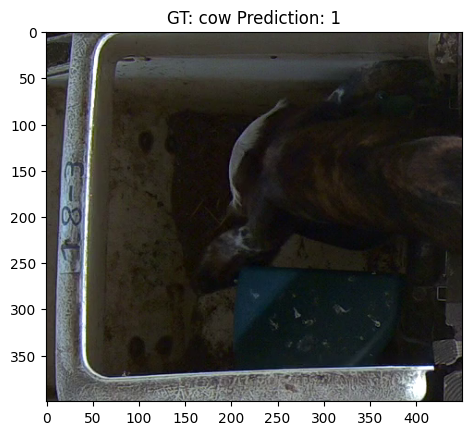

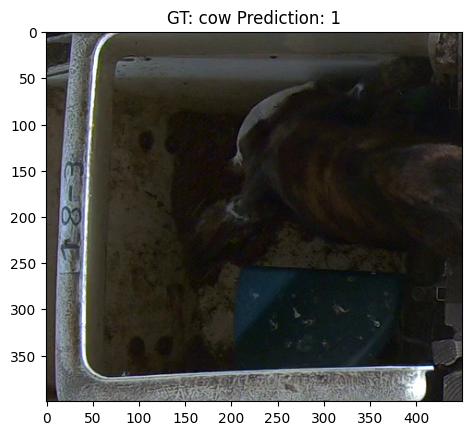

...

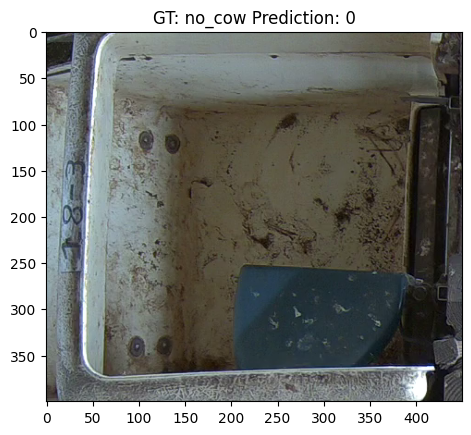

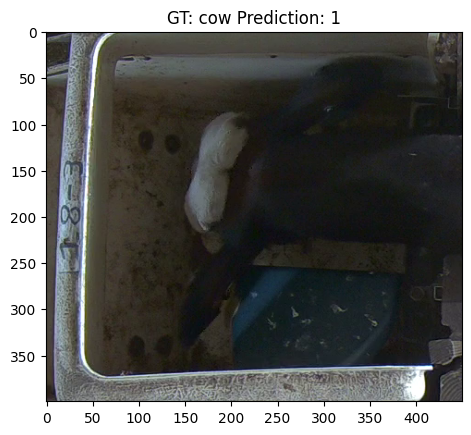

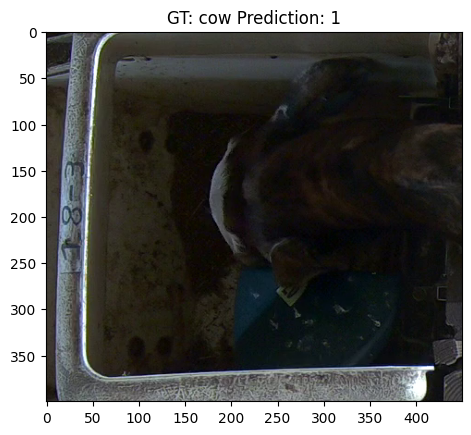

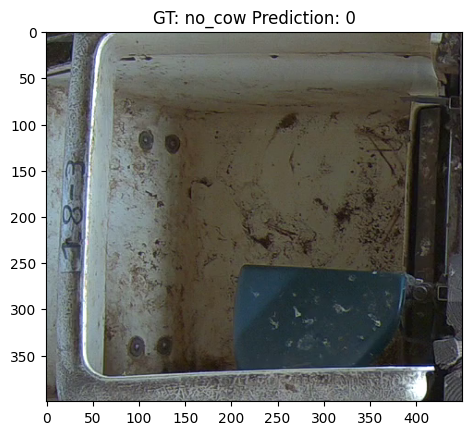

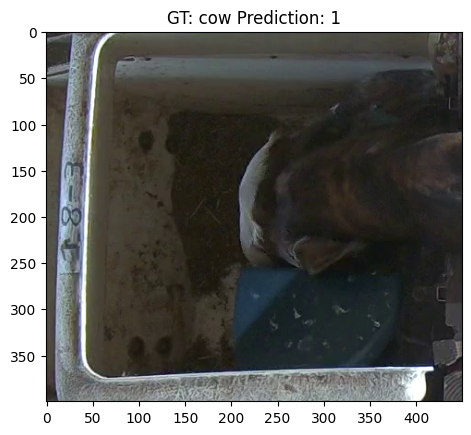

In [32]:
import random

for i in random.sample(range(len(image_data)), 20):
    print(i)
    plt.figure()

    plt.imshow(image_data[i])
    plt.title('GT: {} Prediction: {}'.format(all_labels[i],cluster_labels[i]))


This result shows that the k means method is able to seperate images with and without cows.

In [33]:
image_data.shape

(600, 400, 450, 3)

# Multiple Animal ID

After we find all the frames with animals, for the second round, we do clustering again. This time we try to differetiate different animals.

We first load the annotated table to get time and animal ID.

In [43]:
import gdown
import os

if "EDITED - OUT_SENS_EDITED_2023-08-22_OUTPUT_SENSORSEDITED_FULLDAY_SENSORS - 1032 to1127h.xlsx" not in os.listdir():

  gdown.download('https://drive.google.com/uc?export=download&id=1nMPX6ohLZ5SuC4Qfv8O0Uz31jxxJ812l')
  # ! unzip -q "cow_images_separated_FB3_20230920.zip"

In [44]:
gt=pd.read_excel("EDITED - OUT_SENS_EDITED_2023-08-22_OUTPUT_SENSORSEDITED_FULLDAY_SENSORS - 1032 to1127h.xlsx")

In [45]:
gt

,DateTime,Date,Time,DT_001,DT_002,DT_003,DT_004,DT_005,DT_006,MN_001,...,FBK_02_VISIT,FBK_02_ANIMAL,FBK_03_VISIT,FBK_03_ANIMAL,FBK_04_VISIT,FBK_04_ANIMAL,FBK_05_VISIT,FBK_05_ANIMAL,FBK_06_VISIT,FBK_06_ANIMAL
0,2023-08-22 10:32:00,2023-08-22,10:32:00,30.10,25.31,36.51,24.88,25.40,29.21,1.0,...,0.0,NaN,0,NaN,0,NaN,0.0,NaN,0.0,NaN
1,2023-08-22 10:32:01,2023-08-22,10:32:01,33.99,30.07,36.51,24.88,26.27,29.71,1.0,...,0.0,NaN,0,NaN,0,NaN,0.0,NaN,0.0,NaN
2,2023-08-22 10:32:02,2023-08-22,10:32:02,30.10,26.17,36.51,24.88,30.21,29.73,1.0,...,0.0,NaN,0,NaN,0,NaN,0.0,NaN,0.0,NaN
3,2023-08-22 10:32:03,2023-08-22,10:32:03,30.10,26.15,36.07,24.88,30.21,29.21,1.0,...,0.0,NaN,0,NaN,0,NaN,0.0,NaN,0.0,NaN
4,2023-08-22 10:32:04,2023-08-22,10:32:04,30.12,26.15,36.51,24.88,30.21,29.21,1.0,...,0.0,NaN,0,NaN,0,NaN,0.0,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3323,NaT,2023-08-22,11:27:23,NaN,NaN,5.45,24.00,NaN,NaN,NaN,...,NaN,NaN,1,AN-06,0,NaN,NaN,NaN,NaN,NaN
3324,NaT,2023-08-22,11:27:24,NaN,NaN,5.14,23.99,NaN,NaN,NaN,...,NaN,NaN,1,AN-06,0,NaN,NaN,NaN,NaN,NaN
3325,NaT,2023-08-22,11:27:25,NaN,NaN,3.99,24.86,NaN,NaN,NaN,...,NaN,NaN,1,AN-06,0,NaN,NaN,NaN,NaN,NaN
3326,NaT,2023-08-22,11:27:26,NaN,NaN,3.09,24.86,NaN,NaN,NaN,...,NaN,NaN,1,AN-06,0,NaN,NaN,NaN,NaN,NaN


Here, we combine the date and time string to form datatime data for later useage. This is helpful especially for long term analysis.

In [46]:
gt['DateTime_']=pd.to_datetime(gt['Date'].astype(str) +' '+ gt['Time'].astype(str), format='%Y-%m-%d %H:%M:%S')

In [48]:
directory_path = 'cow_images_separated_FB3_20230920/has_a_cow/'  # Replace with the path to your directory

When reading the images, we also find the corresponding animal ID and store them in the cow_ids. Similar to before, this will be used to calculate the performance.

In [49]:
cow_images = []
cow_ids=[]
for root, dirs, files in os.walk(directory_path):

    for file in files:
        file_path = os.path.join(root, file)
        image=cv2.imread(file_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        cow_images.append(image)

        date_string=file_path[file_path.find('img_')+4:]

        # Extract the date and time part (excluding the '.png' extension)
        date_time_str = date_string.split('.')[0]

        # Convert the string to a pandas datetime object
        pandas_datetime = pd.to_datetime(date_time_str, format='%Y_%m_%d_%H_%M_%S')

        row=gt[gt['DateTime_']==pandas_datetime]

        cow_ids.append(row['FBK_03_ANIMAL'].to_list())
        # break
cow_image_data = np.array(cow_images)

In [51]:
cow_ids[6]

['AN-05']

In [52]:
gt['FBK_03_ANIMAL'].unique()

array([nan, 'AN-06', 'AN-05', 'AN-02'], dtype=object)

The following is similar to previously shown steps. We can do the clustering with unknown number of clusters using DB SCAN, or use the prior knowledge of how many different animals present and use K-means.

In [53]:
features=[]
for image in cow_image_data:
    # file_path=(os.path.join(directory_path, file))
    # image=cv2.imread(file_path)
    image = transform(Image.fromarray(image))
    image = image.unsqueeze(0)  # Add a batch dimension (required by the model)
    feature = feature_extractor(image) # output now has the features corresponding to input x
    features.append(feature.detach().numpy()[0][:][:])

data = np.array(features)[:,:,0,0]

In [54]:
np.array(features).shape

(377, 2048, 1, 1)

In [55]:
data = np.array(features)[:,:,0,0]

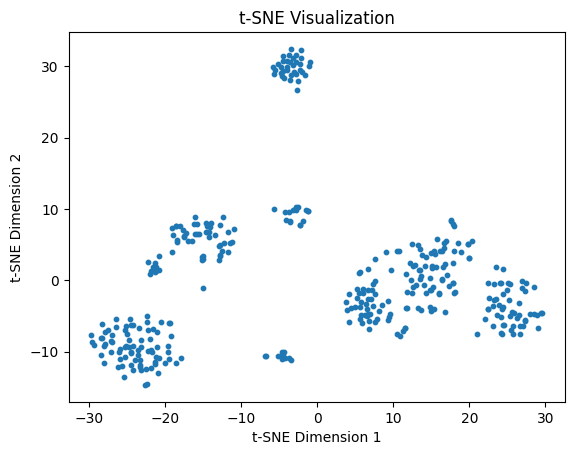

In [56]:
import numpy as np
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

# Generate or load your data, assuming it's a (904, 2048) numpy array
# Replace this with your actual data loading or generation logic


# Initialize t-SNE with the desired number of components (2 for 2D visualization)
tsne = TSNE(n_components=2, random_state=42)

# Fit and transform your data to reduce it to 2 dimensions
tsne_result = tsne.fit_transform(data)

# Create a scatter plot to visualize the t-SNE results
plt.scatter(tsne_result[:, 0], tsne_result[:, 1], s=10)  # s controls point size
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.title('t-SNE Visualization')
plt.show()

# DBSCAN

DBSCAN is a frequency based tool and that does not require us to set a fixed class number. This works for us because we do not know how many animals appear in the videos. We can test out all the eps distance parameters and apply that to all other images.

In [57]:
# Apply PCA to reduce the dimensionality (optional but can improve performance)
pca = PCA(n_components=2)  # You can adjust the number of components as needed
image_data_pca = pca.fit_transform(data)

# Perform DBSCAN clustering
db = DBSCAN(eps=1, min_samples=2)  # You can adjust 'eps' and 'min_samples' as needed
cluster_labels = db.fit_predict(image_data_pca)
print(cluster_labels)
ari = adjusted_rand_score(np.reshape(cow_ids,-1), cluster_labels)
ari

[ 0  1  0  0  2  0  1  1  0  1  1  0  1  0  1  1  1  0  0  1  0  2  1  1
  0  2  0  2  1  1  0  0  1  1  1  1  1  2  0  1  1  0  0  0  2  1  2  0
  0  1  2  1  2  2  0  1  2  0  1  1  0  1  0  1  0  2  0  1  0  0  2  0
  1  0  1  1  0  1  1  0  1  2  0  1  1  0  0  1  1  0  0  0  0  1  0  1
  1  0  1  1  0  1  0  1  0  0  1  1  0  2  2  0  0  2  1  2  2  2  1  1
  1  1  1  1 -1  2  0  0  2  1  1  1  0  0  0  2  2  1  1  1  2  2  0  0
  1  2  0  2  1  1  0  0  0  1  0  1  0  1  1  1  1  1  1  1  2  0  0  1
  0  2  2  1  2  0  2  0  1  1  0  1  1  1  1  1  0  1  1  0  0  1  0  0
  1  1  1  1  1  0  0  0  0  0  2  1  1  1  1  1  0  1  1  0  2  2  1  1
  1  0  2  0  1  0  1  1  1  2  0  2  1  0  2  2  1  1  0  1  1  0  2  1
  1  2  0  1  0  2  1  1  1  0  1  1  1  1  1  2  1  0  1  1  0  0  0  1
  1  0  1  0  0  1  1  1  1  2  1  0  0  0  0  0  0  1  1  2  0  1  2  1
  1  2  1  1  1  0  0  0  1  2  0  2  1  1  1  1  2  0  0  2  0  0  1  0
  0  1  1  1  1  0  1  2  0  1  1  1  1  1  0  1  1

0.8557202403126906

In [58]:
np.reshape(cow_ids,-1)

array(['AN-06', 'AN-05', 'AN-06', 'AN-06', 'AN-06', 'AN-06', 'AN-05',
       'AN-05', 'AN-06', 'AN-05', 'AN-05', 'AN-06', 'AN-05', 'AN-06',
       'AN-05', 'AN-05', 'AN-05', 'AN-06', 'AN-06', 'AN-05', 'AN-06',
       'AN-02', 'AN-05', 'AN-05', 'AN-06', 'AN-06', 'AN-06', 'AN-02',
       'AN-05', 'AN-05', 'AN-06', 'AN-06', 'AN-05', 'AN-05', 'AN-05',
       'AN-05', 'AN-05', 'AN-06', 'AN-06', 'AN-05', 'AN-05', 'AN-06',
       'AN-06', 'AN-06', 'AN-06', 'AN-05', 'AN-02', 'AN-06', 'AN-06',
       'AN-05', 'AN-02', 'AN-05', 'AN-06', 'nan', 'AN-06', 'AN-05',
       'AN-06', 'AN-06', 'AN-05', 'AN-05', 'AN-06', 'AN-05', 'AN-06',
       'AN-05', 'AN-06', 'AN-06', 'AN-06', 'AN-05', 'AN-06', 'AN-06',
       'AN-02', 'AN-06', 'AN-05', 'AN-06', 'AN-05', 'AN-05', 'AN-06',
       'AN-05', 'AN-05', 'AN-06', 'AN-05', 'AN-06', 'AN-06', 'AN-05',
       'AN-05', 'AN-06', 'nan', 'AN-05', 'AN-05', 'AN-06', 'AN-06',
       'AN-06', 'AN-06', 'AN-05', 'AN-06', 'AN-05', 'AN-05', 'AN-06',
       'AN-05', 'AN-05',

If we know there are 3 clusters

In [59]:
num_clusters = 3  # Adjust this to your desired number of clusters
pca = PCA(n_components=10)  # You can adjust the number of components as needed
image_data_pca = pca.fit_transform(data)
# Perform K-means clustering
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
cluster_labels = kmeans.fit_predict(image_data_pca)

ari = adjusted_rand_score(np.reshape(cow_ids,-1), cluster_labels)
ari

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


0.8546911897015569

Show some prediction and ground truth examples

168
81
204
275
350
135
295
197
162
43
270
112
83
371
345
224
188
359
336
288


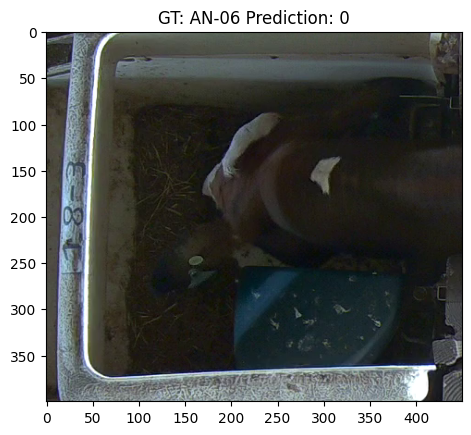

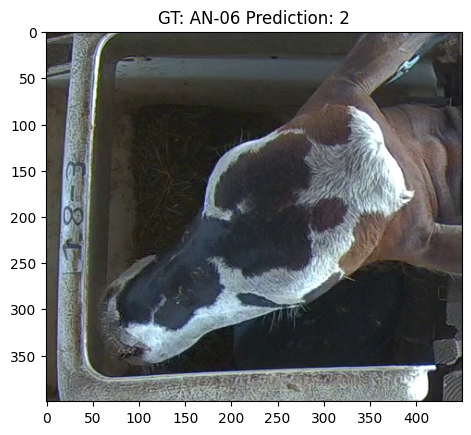

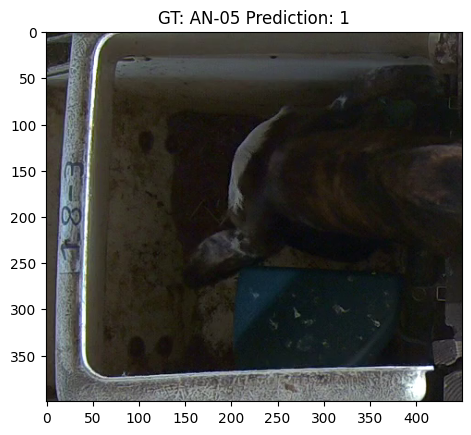

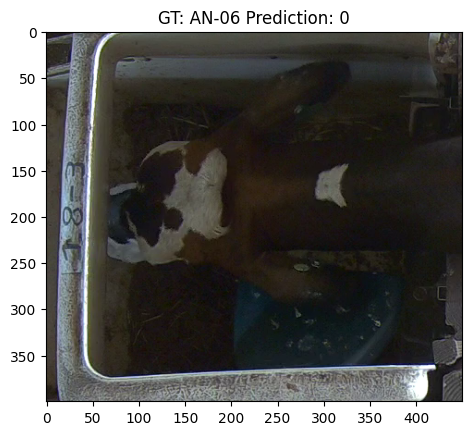

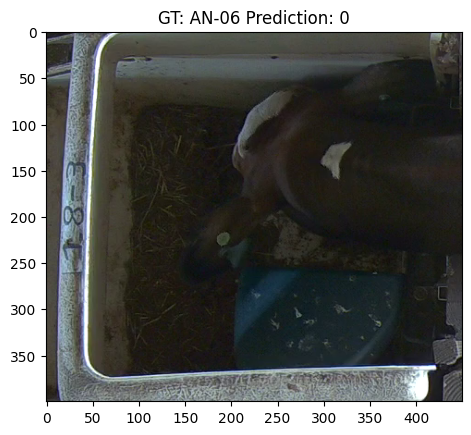

...

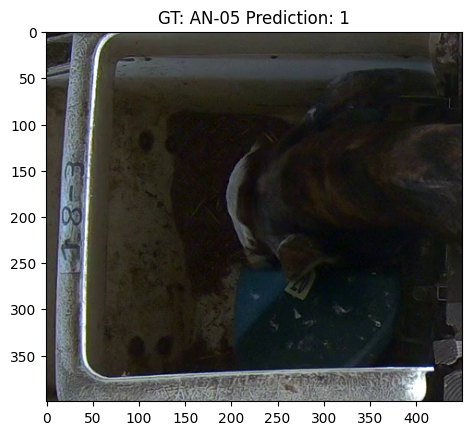

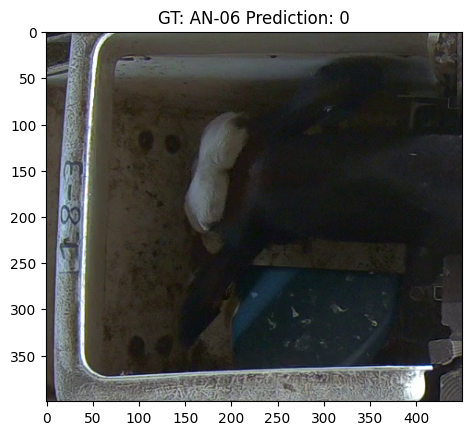

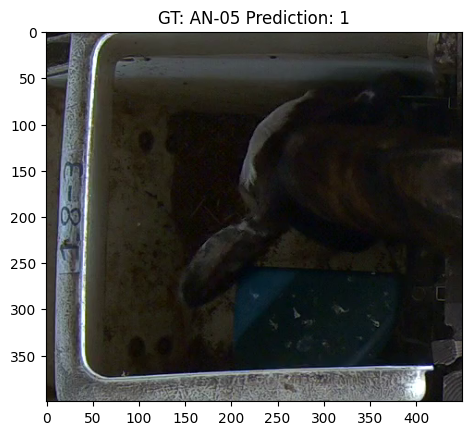

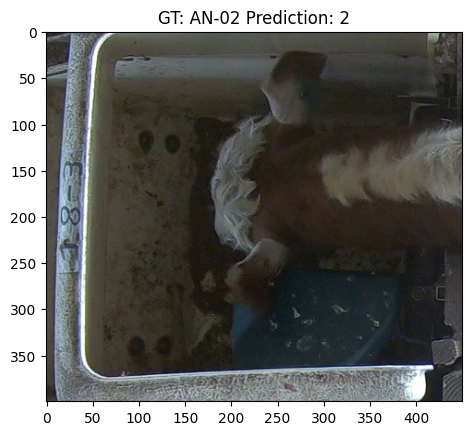

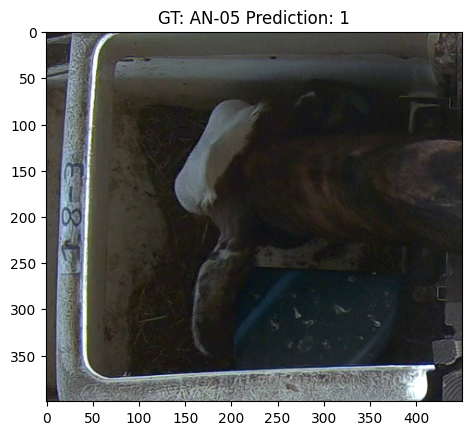

In [60]:
import random

for i in random.sample(range(len(cow_images)), 20):
    print(i)
    plt.figure()

    plt.imshow(cow_images[i])
    plt.title('GT: {} Prediction: {}'.format(np.reshape(cow_ids,-1)[i],cluster_labels[i]))


# Conclusion

The results suggests we can successfully identify the animal presence with a high adjusted rand index of 0.99. This is valualbe in edge computing and the following animal ID step. The animal ID results also show good results with 0.91 adjusted rand index. This shows the potential of using computer vision to automatically identify different animals, hence track their performance, to support prevision livestock farming.